### <p style="text-align: right;"> &#9989; Andrew Koren</p>

Nose' - Hoover thermostat.

Consider lagrangian

$$
L = \sum_{i=1}^N \frac{m_i \dot r_i^2}{2} - V(\{\vec r \}) \\
L_{\text{Nose}} = \sum_{i=1}^N \frac{m_i}{2} s^2 \dot r^2_i - V(\{\vec r\}) + \frac{Q}{2} \dot s^2 - \frac{L}{\beta} \ln s 
$$

Now the hamiltonian

$$
H_{\text{Nose}} = \sum_{i=1}^N \frac{p_i^2}{2m_i s^2} + V(\{\vec r\}) + \frac{p_s^2}{2Q} + \frac{L}{\beta} \ln s 
$$

$s$ is used to rescale from our virtual variables to real ones. 

$$
\vec r' = \vec r \\
\vec p' = \vec p/s \\
s' = s \\
\Delta t' = \Delta t/s
$$

Now we convert a microcanonical simulation with $6N+2$ DoF in virtual variables to a canonical ensemble with real variables. 

Hoover figured out 

$$
\frac{ d\vec r_i}{d t} = \frac{\vec p_i}{m_i} \\
\frac{d\vec p_i}{dt} = - \vec \nabla_i V(\{\vec r\}) - \eta \vec p_i
$$
Where the last term is "friction"
$$
\xi \equiv \frac{d \eta}{dt} = \frac{1}{Q} \left( \sum_{i=1}^N \frac{p_i^2}{m_i} - \frac{3N}{\beta}\right)
$$
Hover used $\eta = \frac{\dot s}{s} = \frac{d \ln s}{dt}$. In fact, this is the only choice that reporduces the canonical ensemble. 

The "fake" system-thermostat hamiltonian is conserved

$$
H_{NH} = \sum_{i=1}^N \frac{p_i^2}{2m_i} + V(\{\vec r \}) + \frac{Q\eta^2}{2} + \frac{3N}{\beta} \ln s
$$

-5
-1.3
-.3



Here's our algorithm with velocity-verlet

<br> 0: Propogate $\{ \xi, \eta, \vec V_i \} \overset{\Delta t/2}{\rightarrow} \{ \xi, \eta, \vec V_i \}$
<br> 1: $\Delta K = \left( \sum_{i=1}^N m_i v_i^2 - 3NT\right) /Q$
<br> $\eta \leftarrow \eta + \Delta K \frac{\Delta t}{4} $
<br> 2: $\vec v_i \leftarrow e^{-\eta \frac{\Delta t}{2} \vec v_i}$
<br> 3: $\vec r_i \leftarrow \vec r_i + \vec v_i \Delta t$ 
<br> 4: $\vec f_i = -\vec \nabla_i V(\{\vec r \})$
<br> 5: repeat 2
<br> 6: repeat 1

# PHY480 Day 24

## In-class assignment: Molecular dynamics simulations -- thermostatting

In this in-class assignment we add the Nose-Hoover thermostat that allows us to sample the canonical ensemble with a very elegant coupling to a single degree of freedom.


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
%matplotlib inline

from numba import njit
from scipy.spatial.distance import cdist
from random import sample
import os
import base64

In [36]:



class ParticleAnimator:
    def __init__(self, fig, Writer, filename):
        self.fig = fig
        self.Writer = Writer
        self.filename = filename
        # List of animation tasks.
        self.animation_sequence = []
        # Optionally hold registered artists (if needed across tasks).
        self.artists = {}

    def register_artist(self, name, artist): #optional
        self.artists[name] = artist

    def set_display(self, fps, total_time):
        """Set up simulation display parameters."""
        self.fps = fps
        self.T = total_time
        self.dt = 1 / fps
        self.frames = int(total_time * fps)

    def generate_frame_data(self, data, update_period=None, update_fps=None):
        """
        Given a list 'data' (each element holding frame input) and an update condition,
        this function creates a dictionary mapping each simulation frame (0-indexed)
        to the last update value.
        """
        if update_fps is not None:
            update_interval = int(self.fps / update_fps)
        elif update_period is not None:
            update_interval = int(update_period / self.dt)
        else:
            update_interval = 1  # Update every frame

        # Create a dictionary of frame data. At frames that are multiples of update_interval,
        # we pick the next value from 'data' (if available). Otherwise, repeat the last value.
        frame_data = {}
        current_data = None
        update_index = 0
        for i in range(self.frames):
            if i % update_interval == 0 and update_index < len(data):
                current_data = data[update_index]
                update_index += 1
            frame_data[i] = current_data
        return frame_data

    def animate_ax(self, ax, method, frame_data, *args):
        """
        Register an animation task. 
        - ax: the axis to update.
        - method: update function that takes (ax, frame_data, *args)
        - frame_data: a dictionary mapping frame number to data.
        - args: additional fixed arguments (e.g., dynamic artist handles) to pass.
        """
        self.animation_sequence.append({
            'ax': ax,
            'method': method,
            'frame_data': frame_data,
            'args': args
        })

    def make_animation(self):
        """
        Loop over frames, calling each animation task's method if its update data exists,
        then capturing the frame with writer.grab_frame().
        """
        writer = self.Writer(self.fps)
        with writer.saving(self.fig, self.filename, dpi=100):
            for i in range(self.frames):
                for anim in self.animation_sequence:
                    frame_input = anim['frame_data'][i]
                    if frame_input is not None:
                        anim['method'](anim['ax'], frame_input, *anim['args'])
                writer.grab_frame()
    
    def display(self, width=800):
        """Auto-display an animation inline (MP4, GIF, or WebP) in a Jupyter notebook."""
        ext = os.path.splitext(self.filename)[1].lower()

        with open(self.filename, "rb") as file_:
            data = file_.read()
        encoded = base64.b64encode(data).decode("utf-8")

        # ffmpeg or pillow
        if ext == ".mp4":
            return HTML(f"""
            <video width="{width}" controls>
                <source src="data:video/mp4;base64,{encoded}" type="video/mp4">
                Your browser does not support the video tag.
            </video>
            """)
        elif ext == ".gif":
            return HTML(f"""
            <img src="data:image/gif;base64,{encoded}" width="{width}">
            """)
        elif ext == ".webp":
            return HTML(f"""
            <img src="data:image/webp;base64,{encoded}" width="{width}">
            """)
        else:
            return HTML("<p>Unsupported file format for inline display.</p>")




In [4]:
def initial_r( lbox, r ):
    N, dim = r.shape
    r[:] = np.random.rand(*r.shape) * lbox
    i = 1
    breaker = 0  

    while i < N:
        while (cdist(r[:N+1],r[:N+1]) + np.eye(len(r[:N+1]), len(r[:N+1]))*2 < 1).any():
            r[i] = np.random.rand(2) * lbox
            breaker += 1
            if breaker == 1000:
                r[:] = np.random.rand(*r.shape) * lbox
                breaker = 0
                i = 1
        breaker = 0
        i += 1
    
def easy_initial_r( lbox, r, jitter=0):
    grid_spacing = 1+jitter
    grids = np.meshgrid(*[np.arange(1, l, grid_spacing) for l in lbox])
    all_points = np.column_stack([grid.ravel() for grid in grids])

    apply_jitter = lambda x: x + (np.random.rand()-0.5)*jitter
    all_points = np.vectorize(apply_jitter)(all_points)

    assert (cdist(all_points, all_points) + 2*np.eye(len(all_points)) >= 1).all()
    r[:] = np.array(sample(list(all_points), k=len(r)))

def initial_v( lbox, v, T, masses ):
    sigma = np.sqrt(T/masses)

    v[:] = np.random.randn(*v.shape)  * sigma
    
    v_cm = np.sum(masses * v, axis=0) / sum(masses)

    
    v[:] -= v_cm

@njit
def forces_lj( lbox, r, f, rcut, PBC ):

    # set the parameters for calculation
    N = r.shape[0]  # read off the number of particles
    nd = r.shape[1] # read off the dimensions
    rcut_sq = rcut*rcut # to speed up comparisons #whats this for?
    dr = np.zeros(nd) # vector between two particles
    df = np.zeros(nd) # force contribution from one pair
    lbox2 = lbox/2 # speed up calculations
    
    # set the force array to zero
    f *= 0
    
    # loop over the first particle
    for i in range(N):
        # loop over the second particle
        for j in range(i+1, N):
            Dx = r[j] - r[i]
            if PBC:
                Dx = (Dx + lbox2) % lbox - lbox2

            # if dist_sq is less than rcut_sq, there is a contribution to the force from this pair
            dist = np.sqrt(np.sum(Dx**2))
            if dist < rcut:
                continue
            
            df = 24/dist**8 * ( 1 - 2/dist) * Dx
            f[i] += df
            f[j] -= df

@njit
def measure_pot( lbox, r, rcut, PBC=True ):
    
    # read off parameters
    N = r.shape[0]
    nd = r.shape[1]
    rcut_sq = rcut*rcut
    dr = np.zeros(nd)
    lbox2 = lbox/2

    pot = 0
    
    # loop over the first particle
    for i in range(N):
        # loop over the second particle
        for j in range(i+1, N):
            Dx = r[j] - r[i]
            if PBC:
                Dx = (Dx + lbox2) % lbox - lbox2
            
            dist = np.sqrt(np.sum(Dx**2))
            if dist < rcut:
                continue    

            pot += 4 * (dist**(-12) - dist**(-6))


    return pot

def measure_kin( v, masses ):

    v2 = np.sum(v**2)
    return sum(v2*masses/2)

def boundary_periodic( lbox, r, v ):

    r[:] = r % lbox

def boundary_wall( lbox, r, v ):

    # loop on particles and r components,
    # if r is outside, reflect back in,
    # reverse the velocity if needed
    
    #safety
    if (abs(r - lbox/2) > lbox*1.5).any():
        raise ValueError('full ring not implemented!')

    #hard wall
    v[r<0] *= -1
    r[r<0] *= -1

    v[r>lbox] *= -1
    r[:] = np.where(r>lbox, 2*lbox-r, r)

boundary = [boundary_wall, boundary_periodic]

def update_r( dt, r, v ):

    r[:] = r + v*dt
    
def update_v( dt, v, f, masses ):

    v[:] = v + f/np.array(masses)*dt

**Task 1.** Assuming that we have a fully working microcanonical molecular dynamics code for Lennard-Jones fluid (i.e. initialization, forces, velocity-Verlet updating), implement the Nose-Hoover thermostat which updates the thermostat variables and rescales the velocitites. To pass the thermostat variables around, use a two-value array `eta_zeta` where the first entry is $\eta$ and the second is $\zeta$.


In [5]:
# Nose-Hoover thermostat
# dt -- time step
# v -- array with particle velocities
# eta_zeta -- array of two values: eta and zeta -- thermostat variables
# Q -- thermostat coupling
# T -- temperature
# massess -- array with particle masses
# Output:
# the input v and eta_zeta is changed
def nose_hoover_thermo( dt, v, eta_zeta, Q, T, masses ):
    DoF = np.prod(v.shape)
    # get the instantaneous kinetic energy
    # deviation of the kinetic energy from the average
    K = (v**2*masses/2).sum()
    DK = K - DoF*T/(2*Q)

    # propagate zeta for dt/4
    eta_zeta[1] += DK*dt/4

    # scale velocities with the new zeta
    v[:] *= np.exp(-eta_zeta[1]*dt/2)

    # propagate eta=ds/dt/s for dt/4
    eta_zeta[0] += eta_zeta[1]*dt/4

    # finish propogating zeta
    K = (v**2*masses/2).sum()
    DK = K - DoF*T/(2*Q)

    eta_zeta[1] += DK*dt/4

**Task 2.** Put together full canonical molecular dynamics simulation for Lennard-Jones fluid. Measure the total Nose-Hoover energy (conserved quantity) during the evoluton, as well as the instantaneous temperature, kinetic and potential energy of the system.

In [6]:
### main parameters

# dimension
dim = 2

# number of particles
N = 100 # increase once the code is working properly

# particle radius (for plotting)
radius = 0.5

# set potential to zero at this distance
rcut = 3

# box sizes (the size of this array should match "dim"),
# to simplify, box size should be >= 2*rcut
lbox = np.array( [12.0,12.0] )

# allocate arrays for the position r and velocity v,
# the first index is particle index and the second is the vector component
r = np.zeros( (N,dim) )
v = np.zeros( (N,dim) )

# allocate array for the forces
f = np.zeros( (N,dim) )

# array with masses (set to 1 for now)
masses = np.full( N, 1.0 )


# for reproducibility
np.random.seed(2)

# time step
dt = 0.003

# temperature (in microcanonical distribution it is only used for the initial configuration)
Temp = 5

# periodic boundary conditions if True
PBC = False

# Nose-Hoover thermostat coupling
Q = 0.5
eta_zeta = np.zeros( 2 )

# Nose-Hoover thermostat if True
NHT = True

pmas = np.array([[m] for m in masses])


In [43]:
# initialize particle positions and velocities
easy_initial_r( lbox, r, jitter=0.1)
initial_v( lbox, v, Temp, pmas)

In [44]:
# animation characteristics
1/dt#= 333.333 fps

# since dt is too large:
anim_fps = 30
anim_time = 10

# --- option 1 --- #
#Nsim = anim_fps*anim_time # one frame per frame
#Ninner = 5
#
#if anim_time == None:
#    anim_time = dt*Nsim*Ninner
#else:
#    Ninner = int(anim_time/(dt*Nsim))
#    print(Ninner)

# --- option 2 --- #
Nsim = int(anim_time*anim_fps)
Ninner = int(anim_time/(dt*Nsim))

frame_times = np.linspace(0, anim_time, Nsim)

In [45]:
# precompute forces
r_storage = np.zeros([Nsim,*r.shape])
kin_storage = []
pot_storage = []

# main simulation loop
for i in range(Nsim):
    # inner loop
    for j in range(Ninner):
        # Nose-Hoover thermostat by dt/2
        nose_hoover_thermo( dt/2, v, eta_zeta, Q, Temp, pmas )
        # propagate velocities by dt/2
        update_v( dt/2, v, f, pmas )
        # propagate positions r by dt
        update_r( dt, r, v )
        # apply boundary conditions
        boundary[PBC]( lbox, r, v )
        # compute forces
        forces_lj( lbox, r, f, rcut, PBC)
        # propagate velocities by dt/2
        update_v(dt/2, v, f, pmas)
        # Nose-Hoover thermostat by dt/2
        nose_hoover_thermo(dt/2, v, eta_zeta, Q, Temp, pmas)

    # compute observables (kinetic, potential energy, Nose-Hoover total energy, etc.)
    r_storage[i] = r
    kin_storage.append(measure_kin(v, pmas))
    pot_storage.append(measure_pot(lbox, r, rcut, PBC))

kin_storage = np.array(kin_storage).flatten() 
pot_storage = np.array(pot_storage).flatten() 

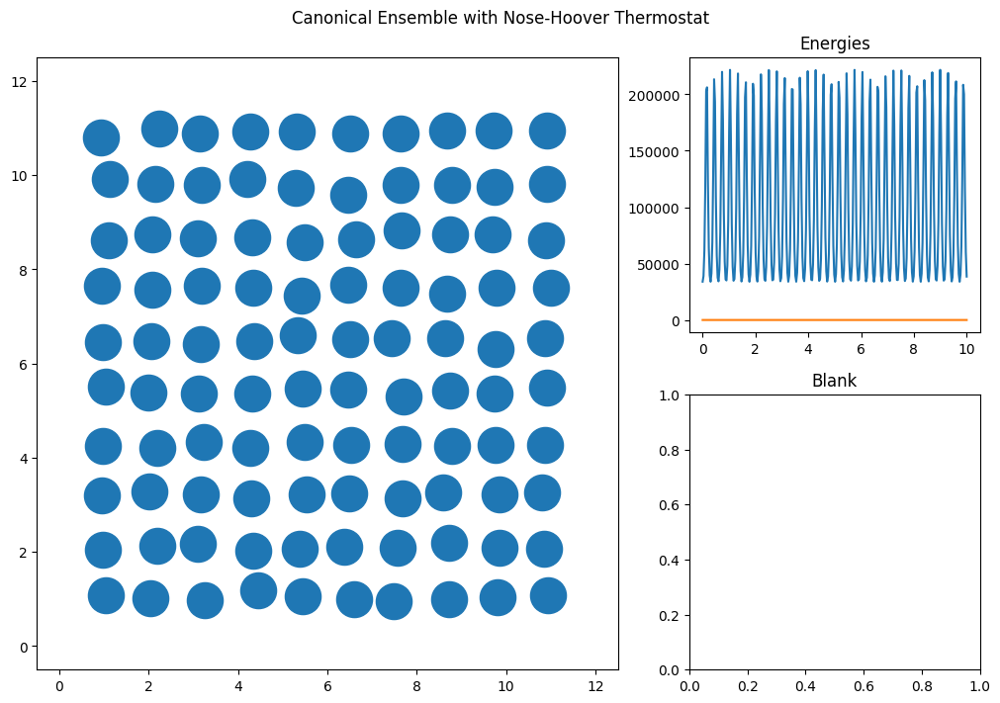

In [46]:
from matplotlib.animation import PillowWriter

output_file = "canonical_ensemble.webp"
fig = plt.figure(constrained_layout=True)
axs = fig.subplot_mosaic([['Left', 'TopRight'],['Left', 'BottomRight']],
                          gridspec_kw={'width_ratios':[2, 1]})

fig.set_figwidth(10)
fig.set_figheight(7)
fig.suptitle('Canonical Ensemble with Nose-Hoover Thermostat')

main_ax = axs['Left']
axs['TopRight'].set_title('Energies')
axs['BottomRight'].set_title('Blank')

if PBC:
    main_ax.set_xlim(0+radius, lbox[0]-radius)
    main_ax.set_ylim(0+radius, lbox[1]-radius)

else:
    main_ax.set_xlim(0-radius, lbox[0]+radius)
    main_ax.set_ylim(0-radius, lbox[1]+radius)

# draw point radius accurately with ax.scatter
data_to_pixels = main_ax.transData.transform
p0 = data_to_pixels((0, 0))      # Origin in pixels
p1 = data_to_pixels((radius, 0))      # Point at (r, 0) in pixels
pixel_r = p1[0] - p0[0]          # Pixel distance for `r`
points_per_pixel = 72 / fig.dpi   # Standard typographic conversion
diameter_points = 2 * pixel_r * points_per_pixel
s = diameter_points ** 2

energy_min, energy_max = min(
min(kin_storage)-kin_storage[0], min(pot_storage)-pot_storage[0], min(kin_storage)+min(pot_storage)-kin_storage[0]-pot_storage[0]), \
max(max(kin_storage)-kin_storage[0], max(pot_storage)-pot_storage[0], max(kin_storage)+max(pot_storage)-kin_storage[0]-pot_storage[0]
)

particles = main_ax.scatter(r_storage[0,:,0], r_storage[0,:,1], s=s)

kin, = axs['TopRight'].plot(frame_times, kin_storage)
pot, = axs['TopRight'].plot(frame_times, pot_storage)


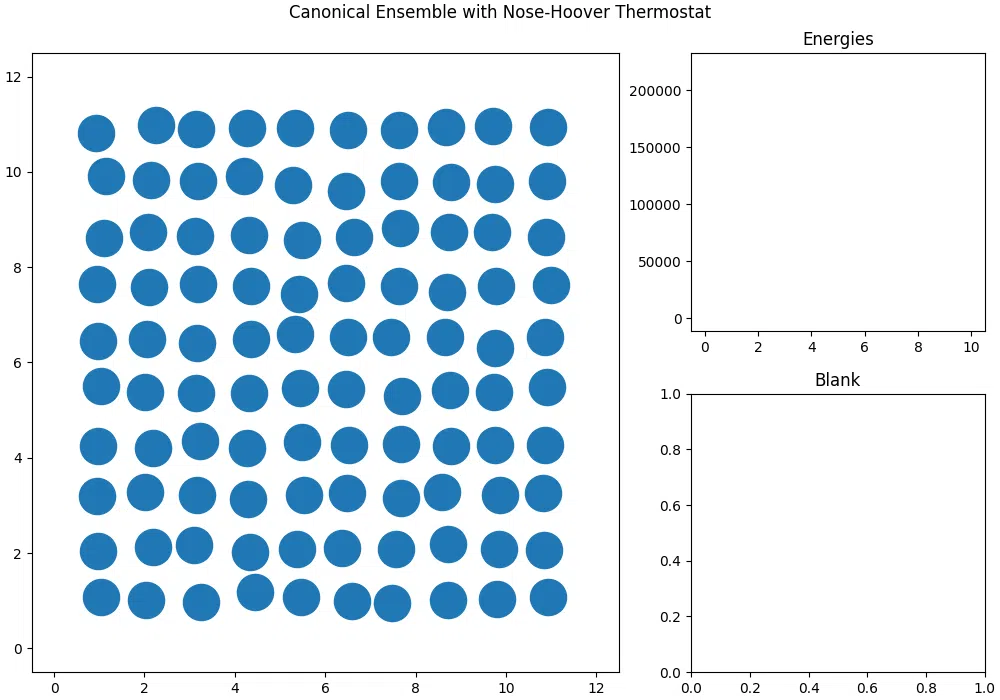

In [47]:
animator = ParticleAnimator( fig, PillowWriter, output_file )
animator.set_display(anim_fps, anim_time)


# --- Particles --- #

def draw_particles(ax, frame_data):
    particles.set_offsets(frame_data)
    
_particle = animator.generate_frame_data(r_storage)
animator.animate_ax(main_ax, draw_particles, _particle)

# -- Energy Plot -- #

def track_kin(ax, frame_data):
    i = frame_data
    kin.set_xdata(frame_times[:i])
    kin.set_ydata(kin_storage[:i])

def track_pot(ax, frame_data):
    i = frame_data
    pot.set_xdata(frame_times[:i])
    pot.set_ydata(pot_storage[:i])

_kin = animator.generate_frame_data([i for i in range(animator.frames)], update_fps=30)
animator.animate_ax(axs['TopRight'], track_kin, _kin)

_pot = animator.generate_frame_data([i for i in range(animator.frames)], update_fps=30)
animator.animate_ax(axs['TopRight'], track_pot, _pot)


# - Make Animation - #
animator.make_animation()
animator.display()

- check kinetic is normal
- temp fluctuates much more
- full hamiltonian 

# Next up: going to 3D!

&#169; Copyright 2025,  Michigan State University Board of Trustees